# Toxic Comment Classification ⛔

In [1]:
! unzip /kaggle/input/jigsaw-toxic-comment-classification-challenge/test.csv.zip
! unzip /kaggle/input/jigsaw-toxic-comment-classification-challenge/train.csv.zip

Archive:  /kaggle/input/jigsaw-toxic-comment-classification-challenge/test.csv.zip
  inflating: test.csv                
Archive:  /kaggle/input/jigsaw-toxic-comment-classification-challenge/train.csv.zip
  inflating: train.csv               


In [ ]:
! pip install lightning

## EDA and Preprocessing


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
import pandas as pd
import nltk
import re
from nltk.corpus import stopwords

In [3]:
train = pd.read_csv('/kaggle/working/train.csv')
test_file = pd.read_csv('/kaggle/working/test.csv')

In [4]:
train, test = train_test_split(train, test_size=0.2, random_state=42)

In [7]:
train.describe()

,toxic,severe_toxic,obscene,threat,insult,identity_hate
count,127656.000000,127656.00000,127656.000000,127656.000000,127656.000000,127656.000000
mean,0.095867,0.00998,0.052751,0.003165,0.049062,0.008703
std,0.294410,0.09940,0.223537,0.056167,0.215997,0.092884
min,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000


In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 127656 entries, 140030 to 121958
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             127656 non-null  object
 1   comment_text   127656 non-null  object
 2   toxic          127656 non-null  int64 
 3   severe_toxic   127656 non-null  int64 
 4   obscene        127656 non-null  int64 
 5   threat         127656 non-null  int64 
 6   insult         127656 non-null  int64 
 7   identity_hate  127656 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 8.8+ MB


We have information about the comment text and the different toxicity grades associated with the comment.

In [9]:
train['token_count'] = train['comment_text'].apply(lambda x: len(str(x).split()))
train['token_count'].describe()

count    127656.000000
mean         67.483785
std          99.710637
min           1.000000
25%          17.000000
50%          36.000000
75%          75.000000
max        1411.000000
Name: token_count, dtype: float64

For token count on the comment text we have a mean count of `67` tokens where the maximum is `1,411` and the minimum being `1`.

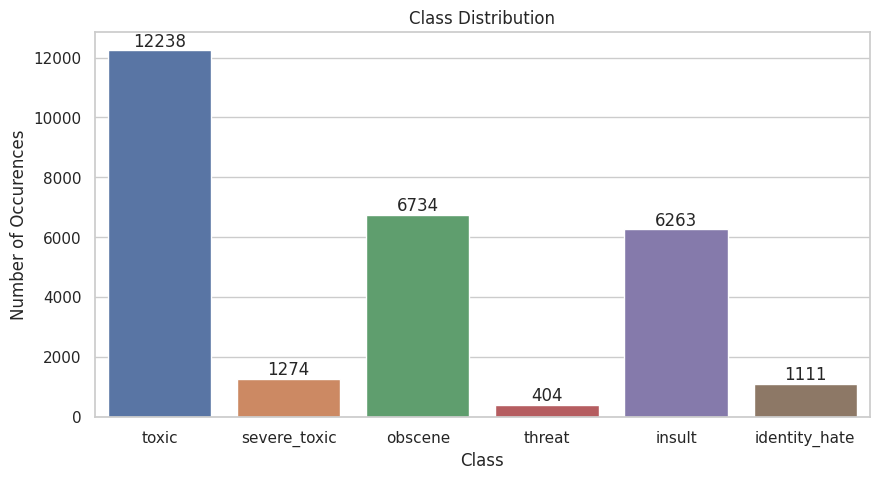

In [11]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 5))
ax = sns.barplot(x=train.iloc[:, 2:-2].columns,
                 y=train.iloc[:, 2:-2].sum().values)
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Occurences")
rects = ax.patches
labels = train.iloc[:, 2:-2].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2,
            height + 5, label, ha='center', va='bottom')
plt.show()

Here we can see that we have more examples from classes like `toxic`, `obscene`, and `insult`.

In [ ]:
def show_value_counts(data, title):
    """
    Show value counts for each class

    Args:
        data: pandas series
        title: title of the plot

    Returns:
        None
    """
    ax = sns.barplot(x=data.index, y=data.values)
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Occurences")
    rects = ax.patches
    labels = data.values
    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2,
                height + 5, label, ha='center', va='bottom')
    plt.show()

Above I have defined a function to find how many samples from each category is actually labeled as existent or not.

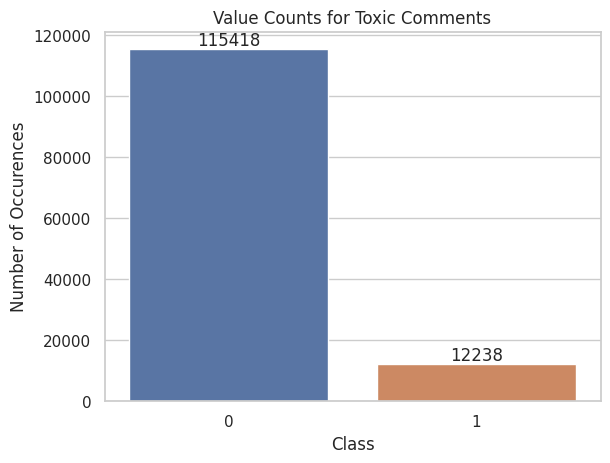

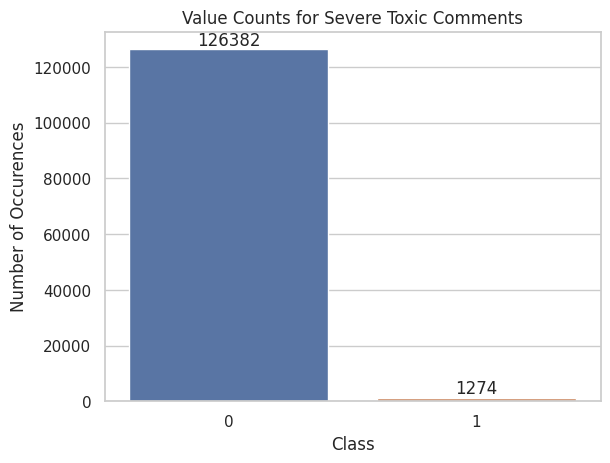

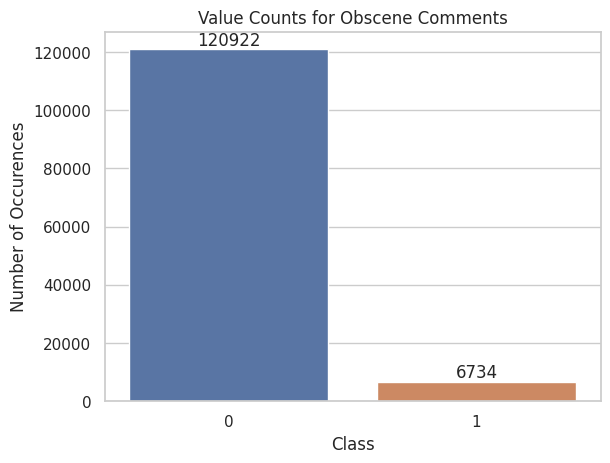

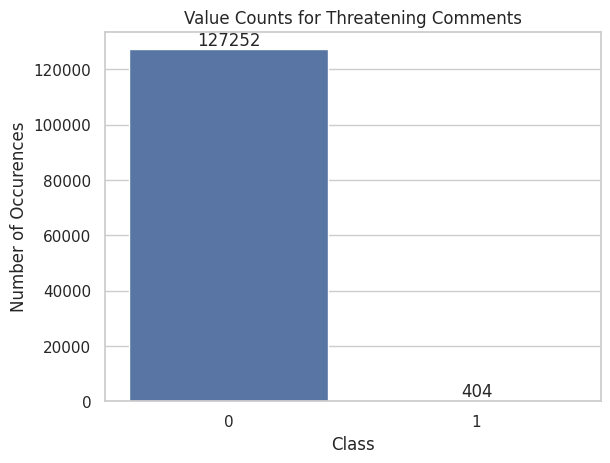

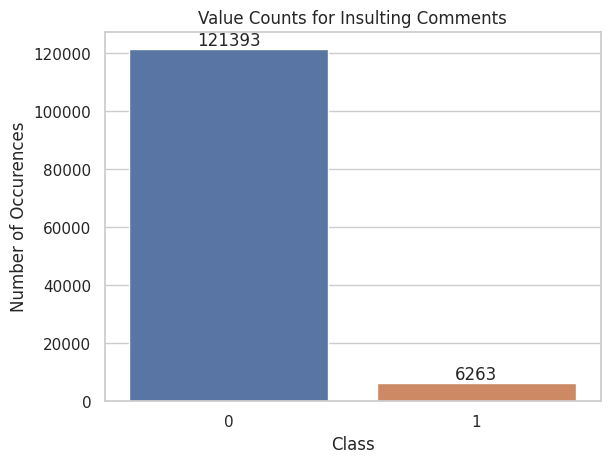

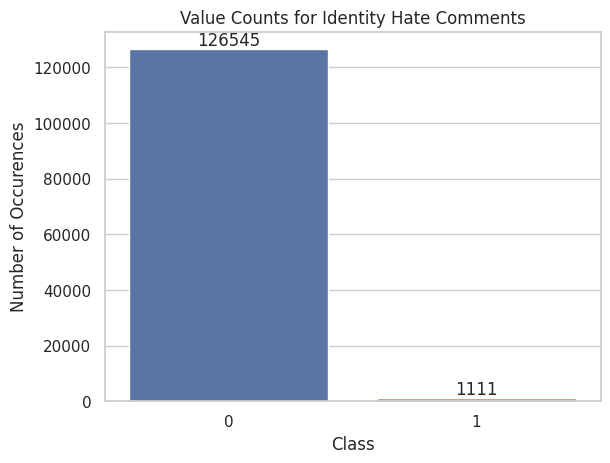

In [12]:
show_value_counts(train['toxic'].value_counts(),
                  'Value Counts for Toxic Comments')
show_value_counts(train['severe_toxic'].value_counts(),
                  'Value Counts for Severe Toxic Comments')
show_value_counts(train['obscene'].value_counts(),
                  'Value Counts for Obscene Comments')
show_value_counts(train['threat'].value_counts(),
                  'Value Counts for Threatening Comments')
show_value_counts(train['insult'].value_counts(),
                  'Value Counts for Insulting Comments')
show_value_counts(train['identity_hate'].value_counts(),
                  'Value Counts for Identity Hate Comments')

From the series of plots above we can see that majority of the classes have smaller amounts of existence.

In [13]:
train['comment_text'] = train['comment_text'].apply(
    lambda x: re.sub(r'[^\w\s]', '', x.lower()))
train['comment_text'].head()

140030    grandma terri should burn in trash \ngrandma t...
159124     9 may 2009 utc\nit would be easiest if you we...
60006     \n\nthe objectivity of this discussion is doub...
65432                      shelly shock\nshelly shock is   
154979    i do not care refer to ong teng cheong talk pa...
Name: comment_text, dtype: object

What I have done here is that I have removed all the stopwords from the comments and then I have joined the words back together to form a sentence without stopwords

In [14]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [16]:
stop = stopwords.words('english')
train['comment_text'] = train['comment_text'].apply(
    lambda x: " ".join(x for x in x.split() if x not in stop))
train['comment_text'].head()

140030    grandma terri burn trash grandma terri trash h...
159124    9 may 2009 utc would easiest admit member invo...
60006     objectivity discussion doubtful nonexistent 1 ...
65432                             shelly shock shelly shock
154979    care refer ong teng cheong talk page la goutte...
Name: comment_text, dtype: object

What I did here is to remove the words that are not in the english dictionary

In [ ]:
def show_wordcloud(data, title):
    """
    Show wordcloud for the given data

    Args:
        data: pandas series
        title: title of the plot

    Returns:
        None
    """
    plt.figure(figsize=(20, 20))
    wc = WordCloud(max_words=2000, width=1600, height=800,
                   stopwords=stop).generate(" ".join(data))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')

The above function plots a wordcloud given the column.

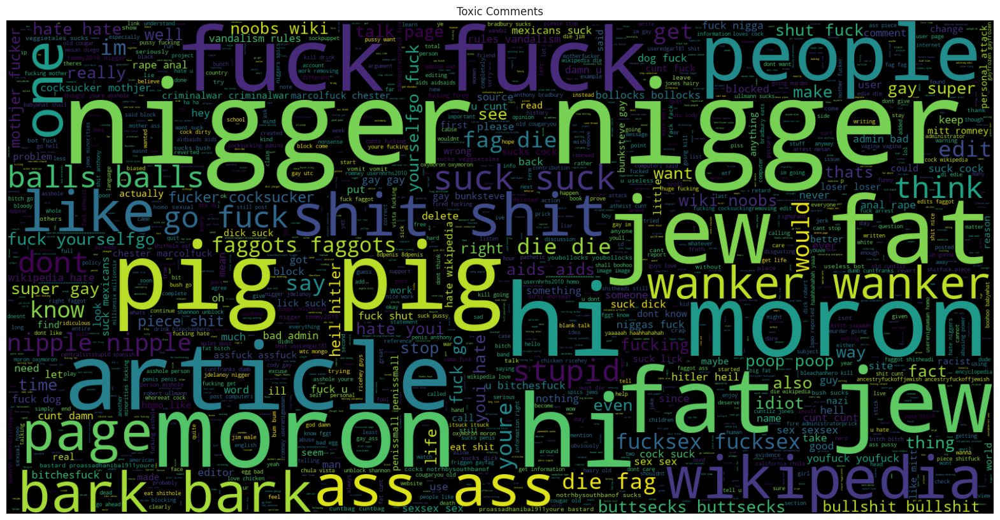

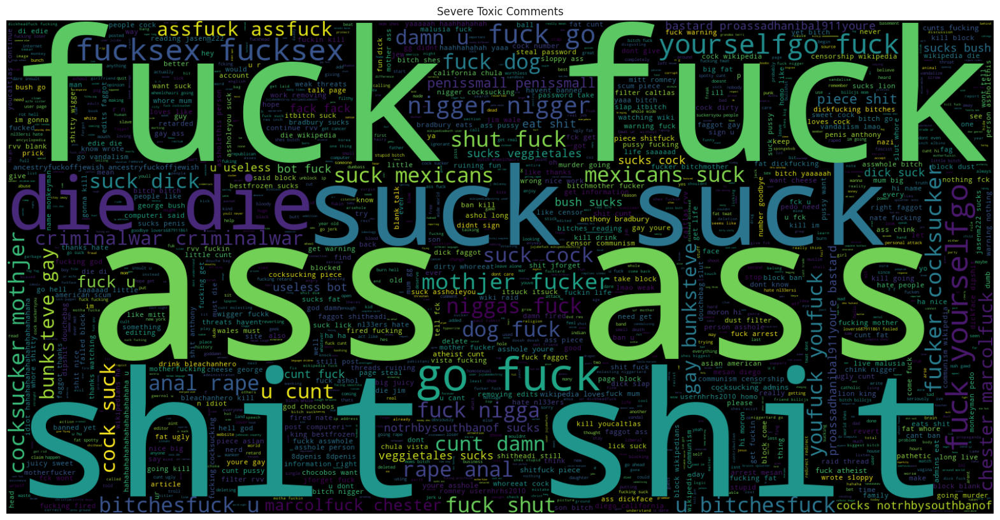

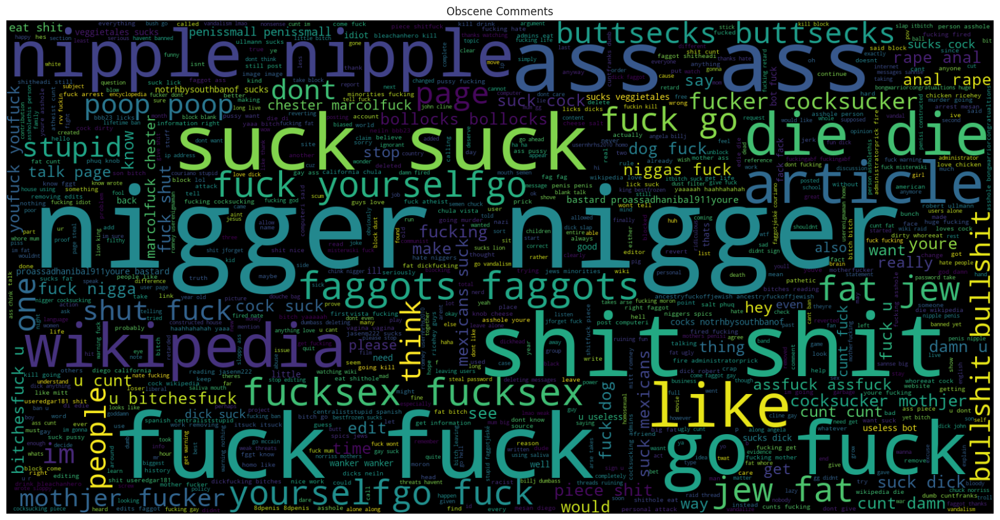

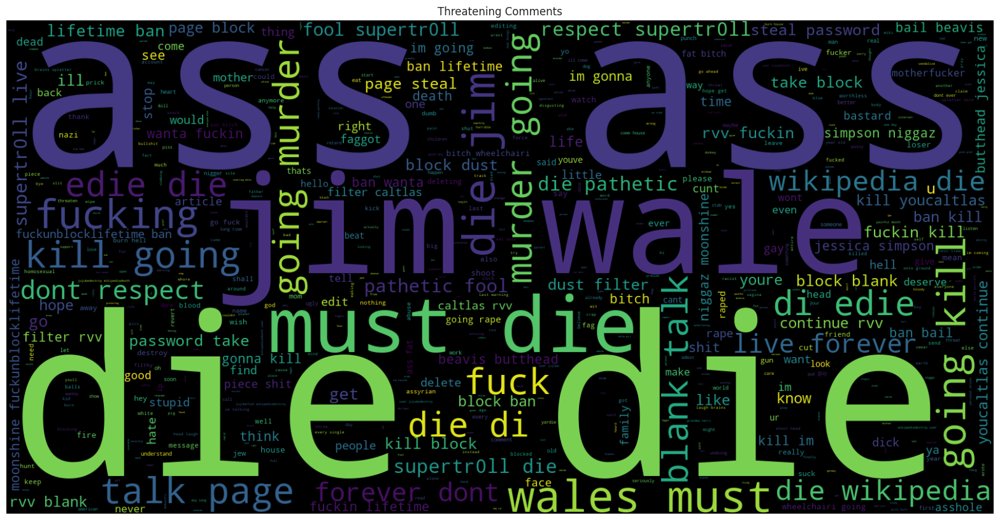

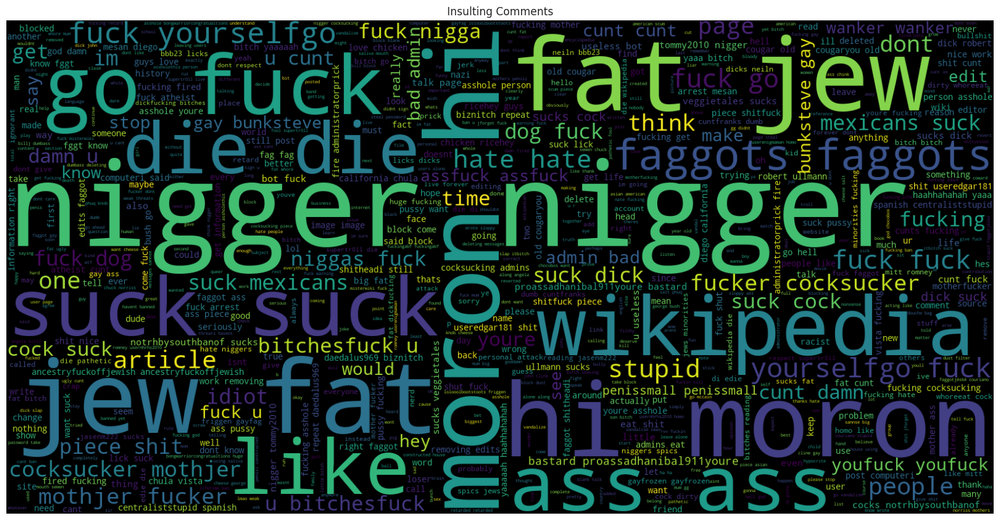

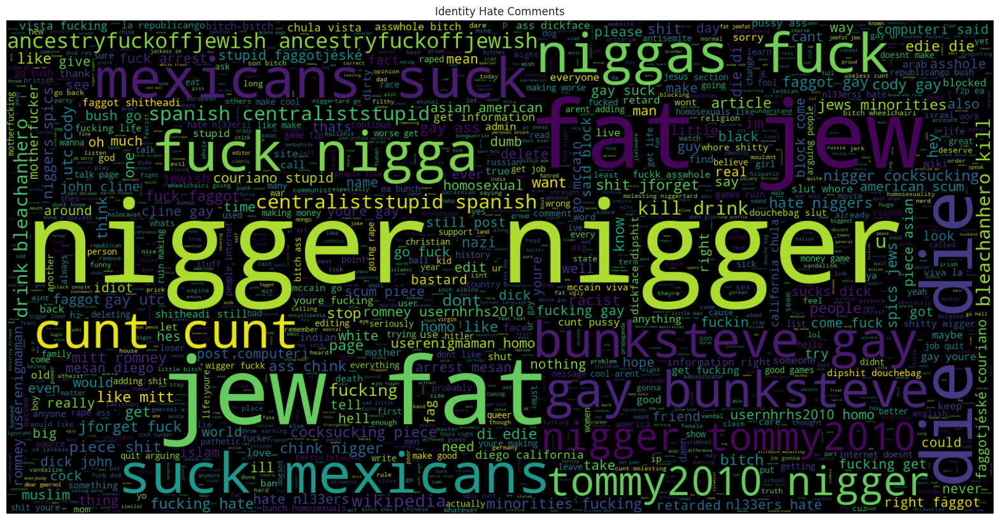

In [17]:
show_wordcloud(train[train['toxic'] == 1]['comment_text'], 'Toxic Comments')
show_wordcloud(train[train['severe_toxic'] == 1]
               ['comment_text'], 'Severe Toxic Comments')
show_wordcloud(train[train['obscene'] == 1]
               ['comment_text'], 'Obscene Comments')
show_wordcloud(train[train['threat'] == 1]
               ['comment_text'], 'Threatening Comments')
show_wordcloud(train[train['insult'] == 1]
               ['comment_text'], 'Insulting Comments')
show_wordcloud(train[train['identity_hate'] == 1]
               ['comment_text'], 'Identity Hate Comments')

Above we can see the most frequent words that exist in each category.

In [ ]:
def generate_ngrams(text, n_gram=1):
    """
    Generate a list of n-grams

    Args:
        text: Text to generate n-grams from
        n_gram: number of grams

    Returns:
        List of n-grams
    """
    text = " ".join(text)
    tokens = [token for token in text.lower().split() if token !=
              "" and token not in stop]
    ngrams = zip(*[tokens[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]



def show_ngrams(data, n_gram, title):
    """
    Show n-grams for the given data

    Args:
        data: pandas series
        n_gram: number of grams
        title: title of the plot

    Returns:
        None
    """
    plt.figure(figsize=(20, 10))
    corpus = data
    top_n_bigrams = pd.Series(generate_ngrams(
        corpus, n_gram)).value_counts()[:10]
    sns.barplot(x=top_n_bigrams.values, y=top_n_bigrams.index)
    plt.title(title)
    plt.xlabel("Number of Occurrences")
    plt.ylabel("Bigram")
    plt.show()

In the above two functions what I did was first of all calcualting the ngrams of words and then taking those generated ngrams on the the second function to display what they look like with thier frequency.

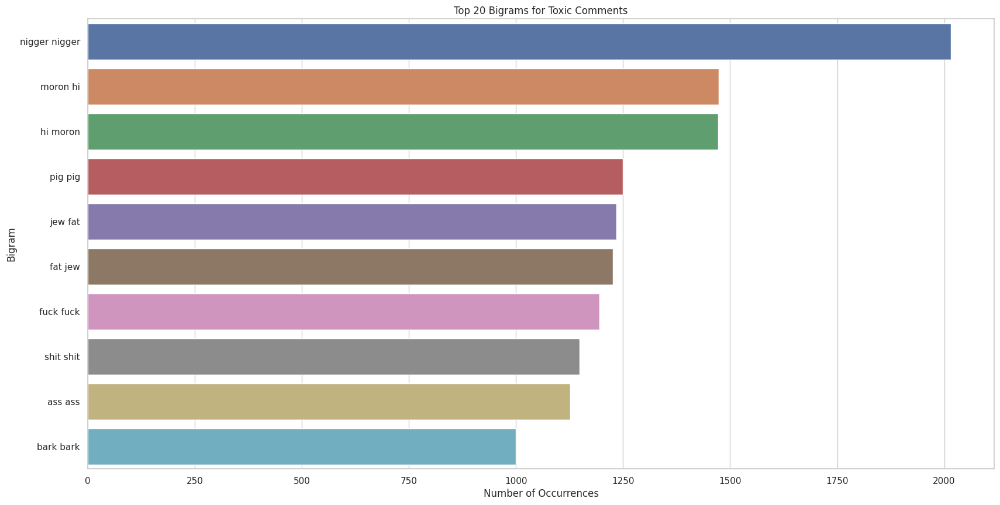

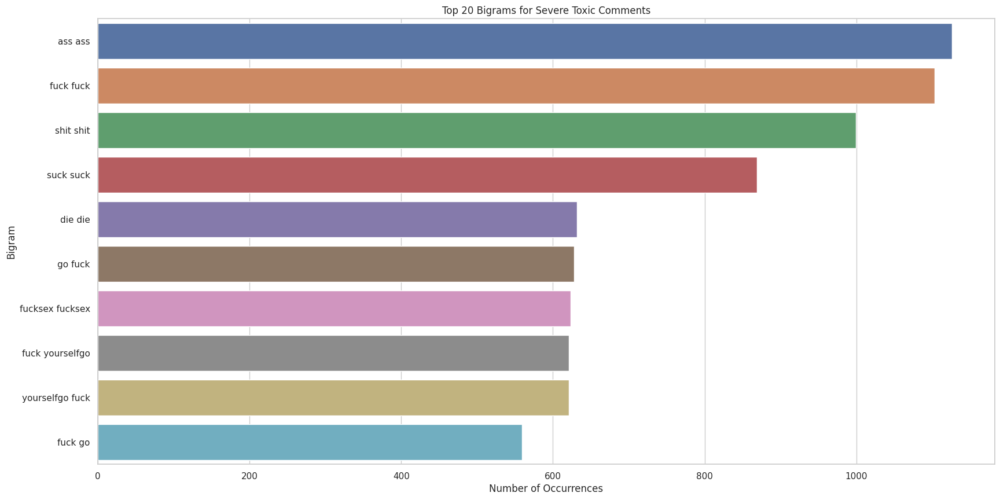

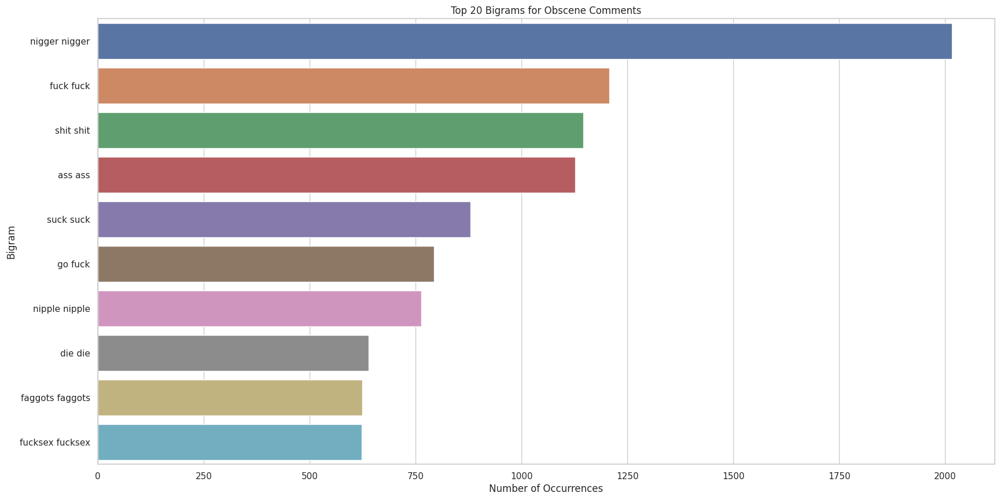

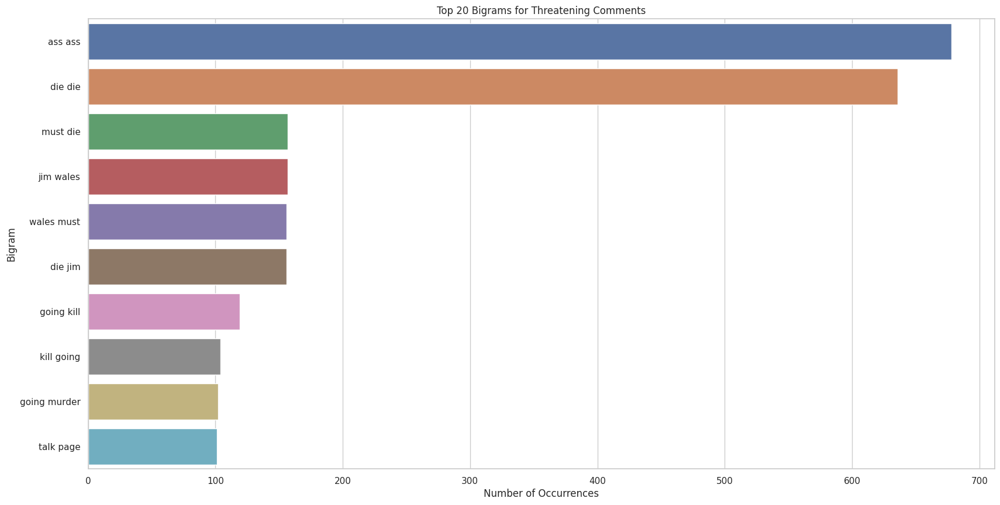

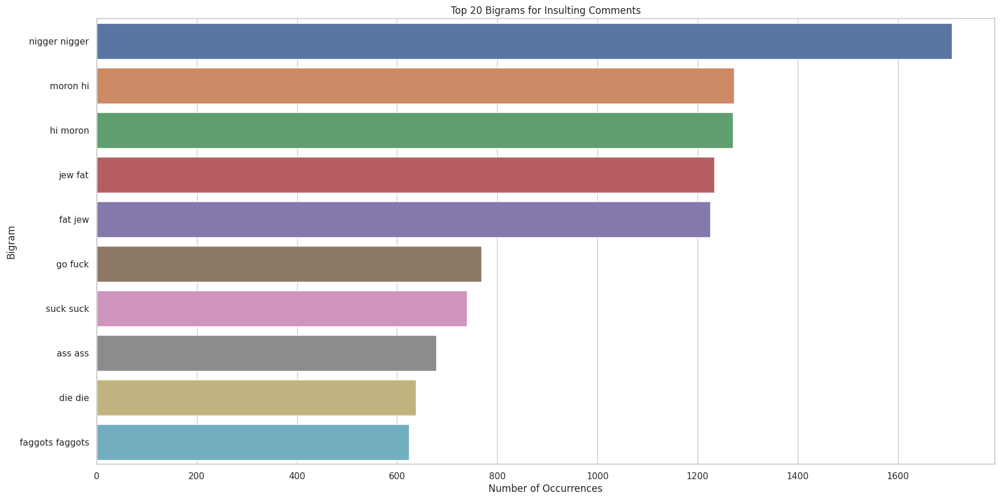

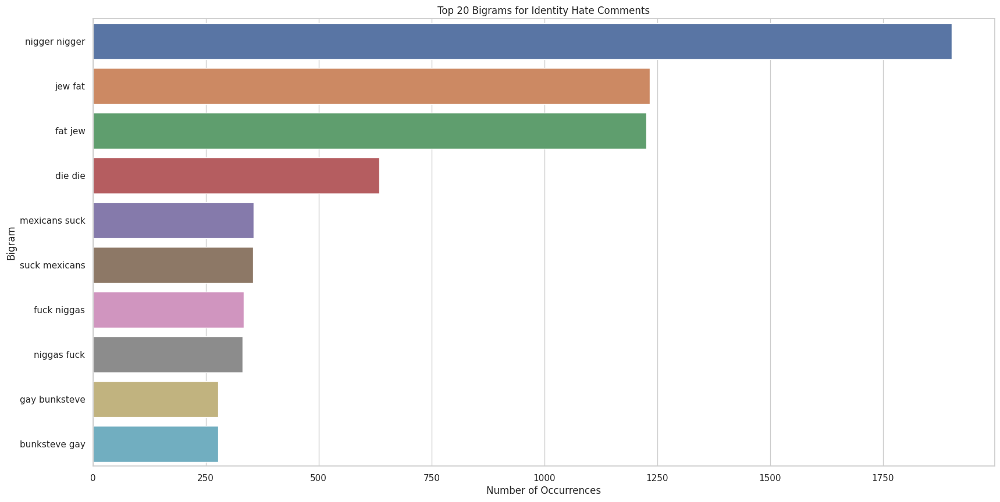

In [ ]:
show_ngrams(train[train['toxic'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Toxic Comments')
show_ngrams(train[train['severe_toxic'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Severe Toxic Comments')
show_ngrams(train[train['obscene'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Obscene Comments')
show_ngrams(train[train['threat'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Threatening Comments')
show_ngrams(train[train['insult'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Insulting Comments')
show_ngrams(train[train['identity_hate'] == 1]['comment_text'],
            2, 'Top 20 Bigrams for Identity Hate Comments')

In [ ]:
def show_distribution(data, title):
    """
    Show distribution of token count and character count

    Args:
        data: pandas dataframe
        title: title of the plot

    Returns:
        None
    """
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 1, 1)
    sns.histplot(data['token_count'], kde=True)
    plt.title(title)
    plt.xlabel("Token Count")
    plt.ylabel("Density")
    plt.subplot(2, 1, 2)
    sns.histplot(data['char_count'], kde=True)
    plt.xlabel("Character Count")
    plt.ylabel("Density")
    plt.show()

In the function above I have created a function to plot the distribution of token and chatacter counts for each target class.

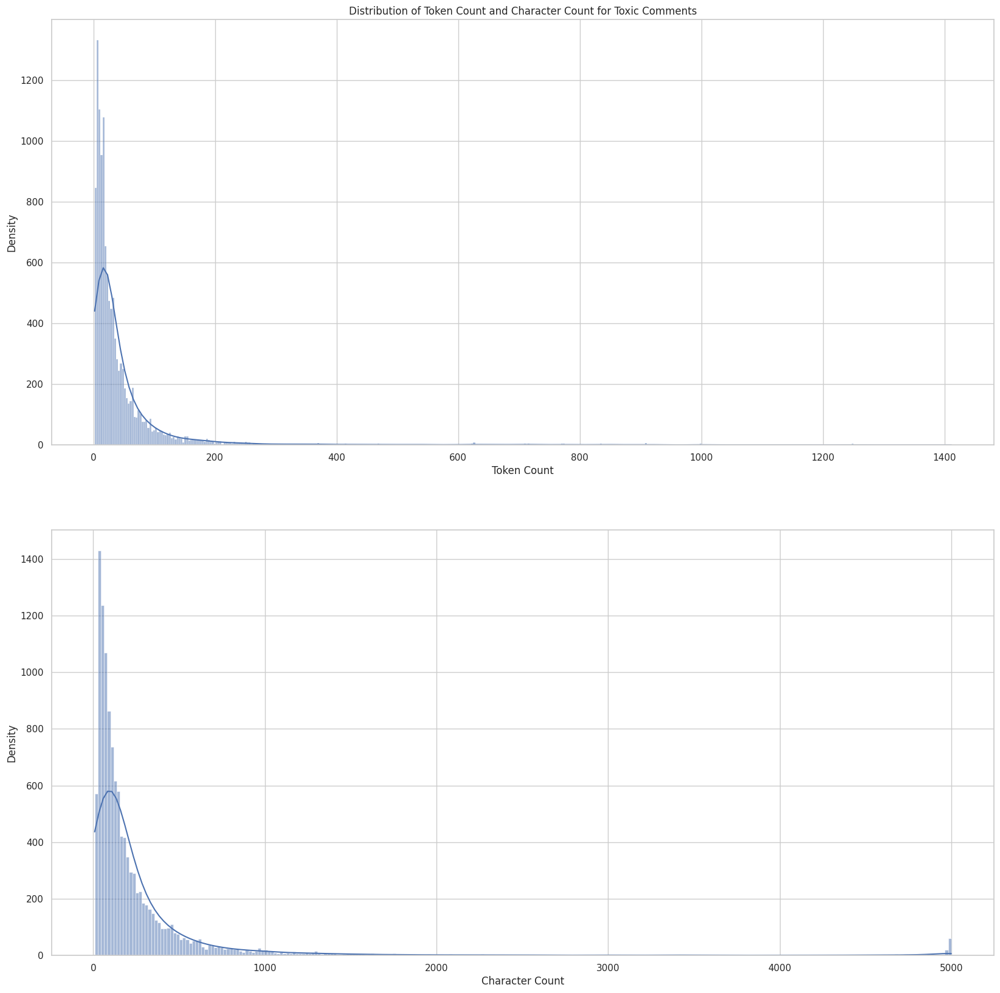

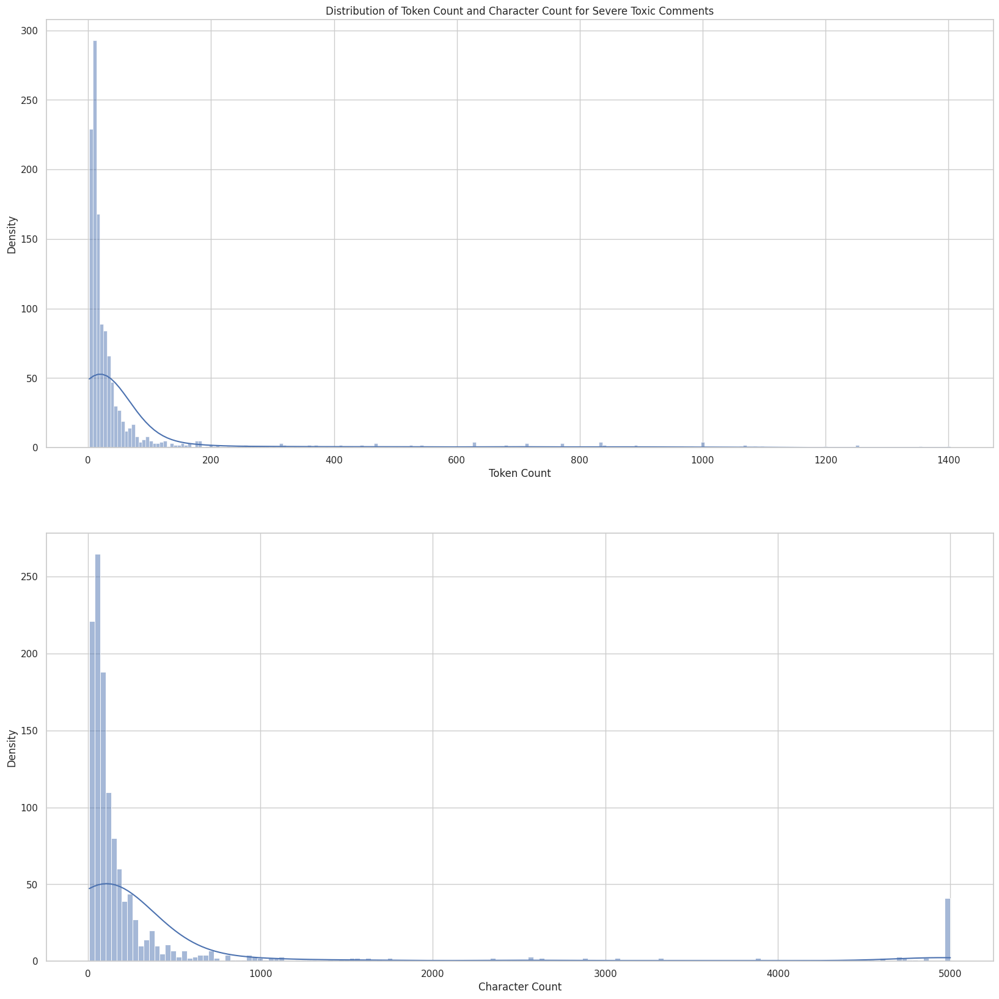

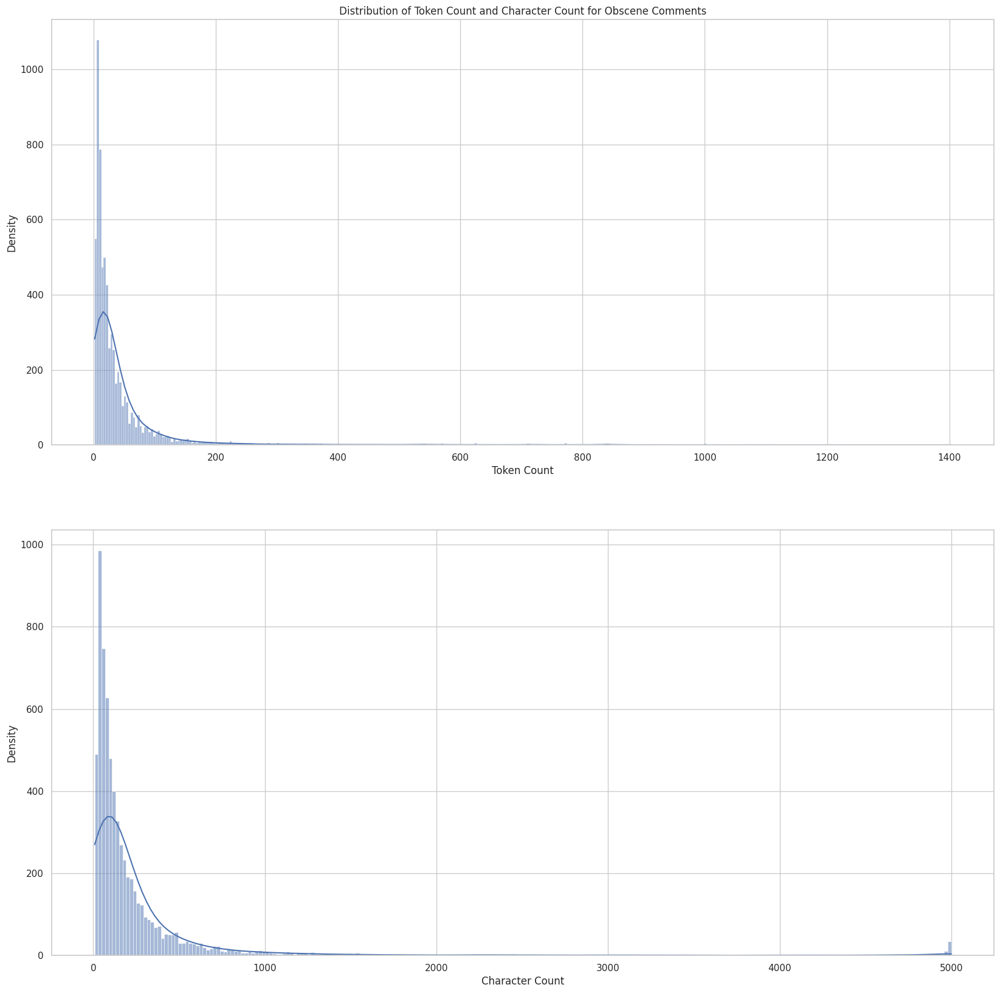

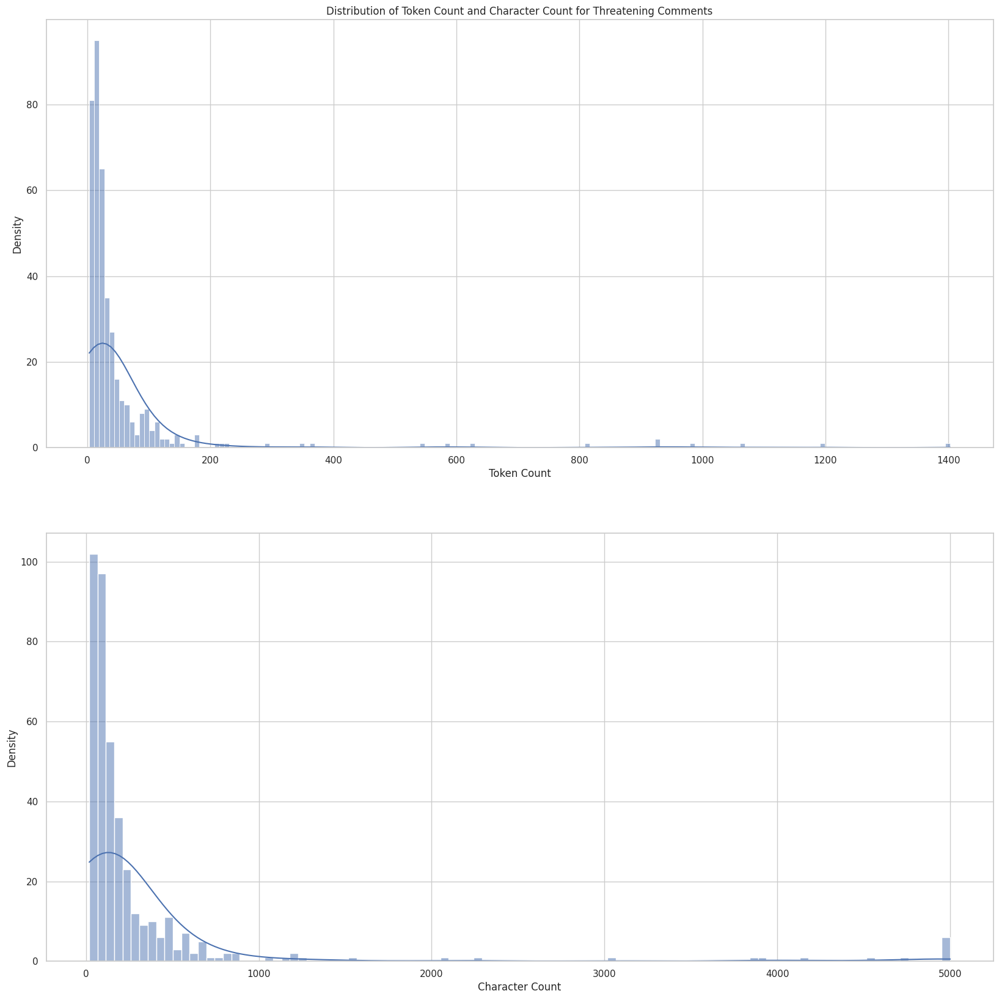

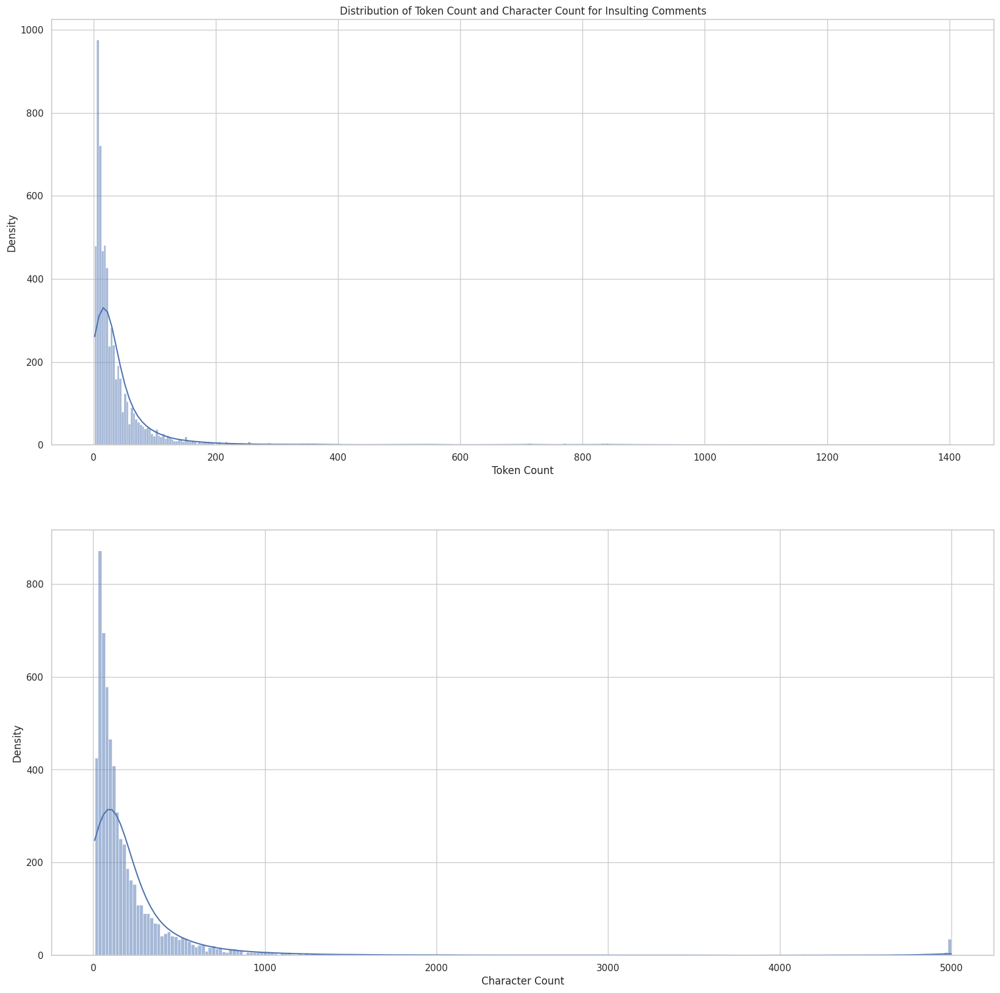

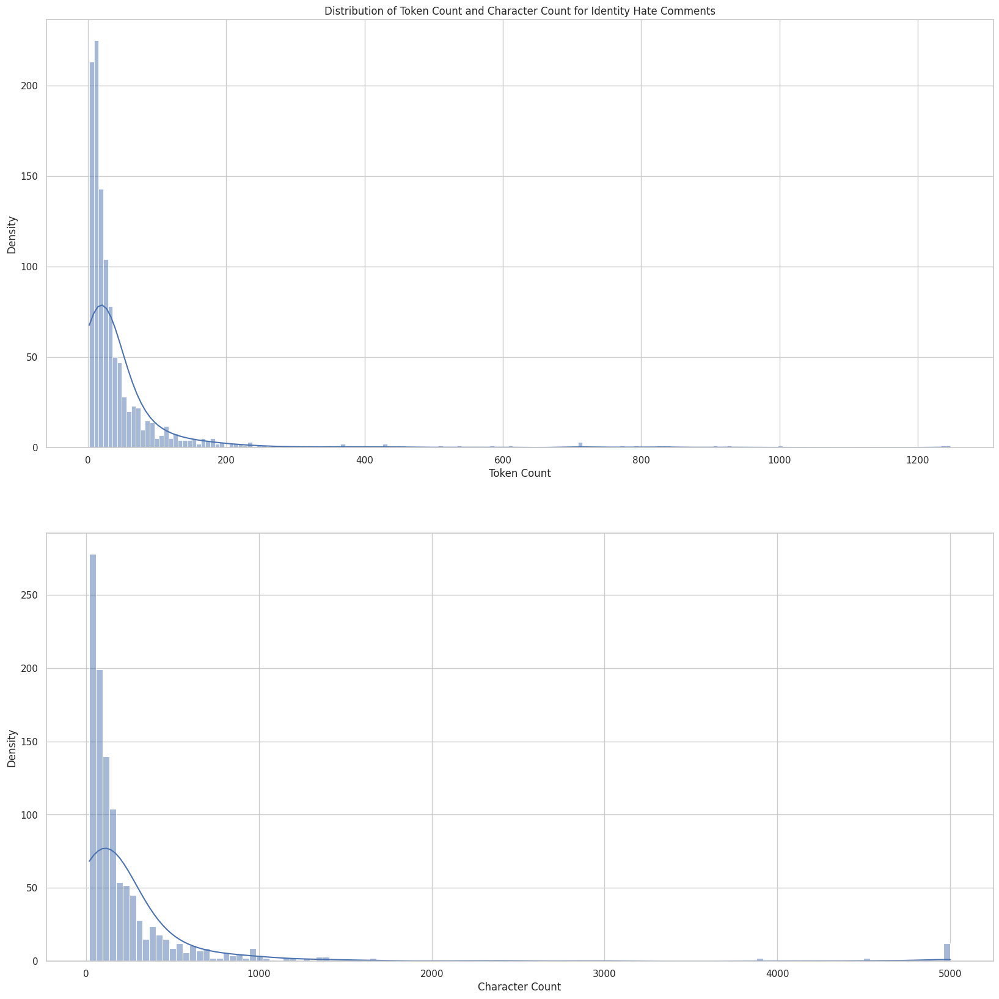

In [19]:
show_distribution(train[train['toxic'] == 1],
                  'Distribution of Token Count and Character Count for Toxic Comments')
show_distribution(train[train['severe_toxic'] == 1],
                  'Distribution of Token Count and Character Count for Severe Toxic Comments')
show_distribution(train[train['obscene'] == 1],
                  'Distribution of Token Count and Character Count for Obscene Comments')
show_distribution(train[train['threat'] == 1],
                  'Distribution of Token Count and Character Count for Threatening Comments')
show_distribution(train[train['insult'] == 1],
                  'Distribution of Token Count and Character Count for Insulting Comments')
show_distribution(train[train['identity_hate'] == 1],
                  'Distribution of Token Count and Character Count for Identity Hate Comments')

## Modelling


In [6]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from lightning.pytorch.loggers.tensorboard import TensorBoardLogger
from lightning.pytorch.callbacks import ModelCheckpoint, EarlyStopping
import torchmetrics
import lightning as pl
from transformers import (AutoTokenizer,
                          DistilBertModel,
                          AdamW, get_linear_schedule_with_warmup)
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch
from tqdm.auto import tqdm
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
from sklearn.metrics import multilabel_confusion_matrix

In this project I have decided to use `DistilBERT` because of the models simplicity interms of runtime for the model training.

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

Then I intialized the tokenizer for DistilBERT

In [8]:
class ToxicCommentsDataset(Dataset):
    def __init__(
        self,
        data: pd.DataFrame,
        tokenizer: AutoTokenizer,
        max_token_len: int = 128,
        label_cols=None
    ):
        """
        Dataset for toxic comments

        Args:
            data: pandas dataframe
            tokenizer: tokenizer
            max_token_len: maximum token length
            label_cols: label columns

        Returns:
            None
        """
        self.tokenizer = tokenizer
        self.data = data
        self.max_token_len = max_token_len
        self.label_cols = label_cols

    def __len__(self):
        """
        Returns length of the dataset

        Args:
            None

        Returns:
            Length of the dataset
        """
        return len(self.data)

    def __getitem__(self, index: int):
        """
        Returns a sample from the dataset

        Args:
            index: index of the sample

        Returns:
            Sample from the dataset
        """
        data_row = self.data.iloc[index]
        comment_text = data_row['comment_text']
        labels = None
        if self.label_cols:
            labels = data_row[self.label_cols]
        encoding = self.tokenizer.encode_plus(
            comment_text,
            add_special_tokens=True,
            max_length=self.max_token_len,
            return_token_type_ids=False,
            padding="max_length",
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        item = dict(
            comment_text=comment_text,
            input_ids=encoding["input_ids"].flatten(),
            attention_mask=encoding["attention_mask"].flatten(),
        )
        if labels is not None:
            item["labels"] = torch.FloatTensor(labels)
        return item


Above is the dataset class I implemented.

In [9]:
class ToxicCommentDataModule(pl.LightningDataModule):
    def __init__(
        self,
        train_df,
        test_df,
        tokenizer,
        batch_size=8,
        max_token_len=128,
        val_split=0.2,
        num_workers=2
    ):
        """
        Data module for toxic comments

        Args:
            train_df: train dataframe
            test_df: test dataframe
            tokenizer: tokenizer
            batch_size: batch size
            max_token_len: maximum token length
            val_split: validation split
            num_workers: number of workers

        Returns:
            None
        """
        super().__init__()
        self.batch_size = batch_size
        self.train_df = train_df
        self.test_df = test_df
        self.tokenizer = tokenizer
        self.max_token_len = max_token_len
        self.val_split = val_split
        self.num_workers = num_workers

    def setup(self, stage=None):
        """
        Setup the data module

        Args:
            stage: stage

        Returns:
            None
        """
        if stage == 'fit' or stage is None:
            # Convert train_df to dataset
            train_dataset = ToxicCommentsDataset(self.train_df,
                                                 self.tokenizer,
                                                 self.max_token_len,
                                                 label_cols=['toxic',
                                                             'severe_toxic',
                                                             'obscene',
                                                             'threat',
                                                             'insult',
                                                             'identity_hate'])

            # Split the dataset into train and validation sets
            num_train = int(len(train_dataset) * (1 - self.val_split))
            num_val = len(train_dataset) - num_train
            self.train_dataset, self.val_dataset = torch.utils.data.random_split(
                train_dataset, [num_train, num_val]
            )

        if stage == 'test' or stage is None:
            self.test_dataset = ToxicCommentsDataset(
                self.test_df, self.tokenizer, self.max_token_len)

    def train_dataloader(self):
        """
        Returns train dataloader

        Args:
            None

        Returns:
            Train dataloader
        """
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            num_workers=self.num_workers
        )

    def val_dataloader(self):
        """
        Returns validation dataloader

        Args:
            None

        Returns:
            Validation dataloader
        """
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers
        )

    def test_dataloader(self):
        """
        Returns test dataloader

        Args:
            None

        Returns:
            Test dataloader
        """
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers
        )

The above class is responsible for splitting the data and creating respective dataloaders for the different splits.

In [10]:
N_EPOCHS = 10
BATCH_SIZE = 12
data_module = ToxicCommentDataModule(
  train,
  test,
  tokenizer,
  batch_size=BATCH_SIZE,
  max_token_len=128
)

Here when initializing the datamodule I picked a maximum token length of 128 again for runtime efficiency reasons.

In [11]:
class ToxicCommentTagger(pl.LightningModule):
    def __init__(
        self,
        n_classes: int,
        class_weights: torch.Tensor = None,
        n_training_steps=None,
        n_warmup_steps=None
    ):
        """
        Toxic comment tagger

        Args:
            n_classes: number of classes
            class_weights: class weights
            n_training_steps: number of training steps
            n_warmup_steps: number of warmup steps

        Returns:
            None
        """
        super().__init__()
        self.bert = DistilBertModel.from_pretrained(
            "distilbert-base-uncased", return_dict=True)
        self.classifier = nn.Linear(self.bert.config.hidden_size, n_classes)
        self.n_training_steps = n_training_steps
        self.n_warmup_steps = n_warmup_steps
        self.criterion = nn.BCELoss(weight=class_weights)
        self.auroc = torchmetrics.AUROC(
            task='multilabel', num_labels=n_classes)

    def forward(self, input_ids, attention_mask, labels=None):
        """
        Forward pass

        Args:
            input_ids: input ids
            attention_mask: attention mask
            labels: labels

        Returns:
            loss, output
        """
        output = self.bert(input_ids, attention_mask=attention_mask)
        sequence_output = output.last_hidden_state
        sequence_output_cls = sequence_output[:, 0, :]
        output = self.classifier(sequence_output_cls)
        output = torch.sigmoid(output)
        loss = 0
        if labels is not None:
            loss = self.criterion(output, labels)
        return loss, output

    def training_step(self, batch, batch_idx):
        """
        Training step

        Args:
            batch: batch
            batch_idx: batch index

        Returns:
            loss, output
        """
        input_ids = batch["input_ids"]
        attention_mask = batch["attention_mask"]
        labels = batch["labels"]
        loss, outputs = self(input_ids, attention_mask, labels)
        self.log("train_loss", loss, prog_bar=True, logger=True, on_epoch=True)
        return {"loss": loss, "predictions": outputs, "labels": labels}

    def validation_step(self, batch, batch_idx):
        """
        Validation step

        Args:
            batch: batch
            batch_idx: batch index

        Returns:
            loss
        """
        input_ids = batch["input_ids"]
        attention_mask = batch["attention_mask"]
        labels = batch["labels"]
        loss, outputs = self(input_ids, attention_mask, labels)
        self.log("val_loss", loss, prog_bar=True, logger=True, on_epoch=True)
        return loss

    def test_step(self, batch, batch_idx):
        """
        Test step

        Args:
            batch: batch
            batch_idx: batch index

        Returns:
            loss
        """
        input_ids = batch["input_ids"]
        attention_mask = batch["attention_mask"]
        labels = batch.get("labels")
        loss, outputs = self(input_ids, attention_mask, labels)
        if labels is not None:
            auroc = self.auroc(outputs, labels)
            self.log("test_auroc", auroc, prog_bar=True, logger=True)
            self.log("test_loss", loss, prog_bar=True, logger=True)
        return loss if labels is not None else outputs

    def on_training_epoch_end(self, outputs):
        """
        Training epoch end

        Args:
            outputs: outputs

        Returns:
            None
        """
        labels = []
        predictions = []
        for output in outputs:
            for out_labels in output["labels"].detach().cpu():
                labels.append(out_labels)
            for out_predictions in output["predictions"].detach().cpu():
                predictions.append(out_predictions)
        labels = torch.stack(labels).int()
        predictions = torch.stack(predictions)
        for i, name in enumerate(['toxic', 'severe_toxic', 'obscene',	'threat',	'insult',	'identity_hate']):
            class_roc_auc = self.auroc(predictions, labels)
            self.log("te_auroc", class_roc_auc, prog_bar=True, logger=True)
            self.logger.experiment.add_scalar(
                f"{name}_roc_auc/Train", class_roc_auc, self.current_epoch)

    def configure_optimizers(self):
        """
        Configure optimizers

        Args:
            None

        Returns:
            Optimizers
        """
        optimizer = AdamW(self.parameters(), lr=2e-5)
        scheduler = get_linear_schedule_with_warmup(
            optimizer,
            num_warmup_steps=self.n_warmup_steps,
            num_training_steps=self.n_training_steps
        )
        return dict(
            optimizer=optimizer,
            lr_scheduler=dict(
                scheduler=scheduler,
                interval='step'
            )
        )

In the above class we use the DistilBERT model, with the loss function being the BCE(Binary Cross Entropy) loss. The `forward` function of the `ToxicCommentTagger` utilizes `input_ids` and `attention_mask` to direct DistilBERT, a compact and efficient variant of BERT, in processing textual data, focusing on relevant information while disregarding padding. The model retrieves the final layer's hidden states, using the first token's state as a sequence representation. This state is then processed through a linear classifier to map it to the required number of classes. A sigmoid function adjusts the classifier's raw logits into probabilities between 0 and 1, suitable for binary or multi-label classification. When training, if true labels are provided, the function calculates the Binary Cross-Entropy loss, potentially weighted to handle class imbalance, and returns this loss along with the predicted probabilities for backpropagation or evaluation purposes.

In [12]:
steps_per_epoch=len(train) // BATCH_SIZE
total_training_steps = steps_per_epoch * N_EPOCHS

Then I calculated the expected steps per epoch and also the total training steps to determine the warmup steps I need.

In [13]:
warmup_steps = total_training_steps // 5
warmup_steps, total_training_steps

(21276, 106380)

In [ ]:
model = ToxicCommentTagger(
  n_classes=6,
  n_warmup_steps=warmup_steps,
  n_training_steps=total_training_steps
)

After that the model was initialized.

In [15]:
checkpoint_callback = ModelCheckpoint(
  dirpath="checkpoints",
  filename="best-checkpoint",
  save_top_k=1,
  verbose=True,
  monitor="val_loss",
  mode="min"
)

I then created a checkpoint callback so that the best performing models are saved as checkpoints which would help for latter trainings as well. The criterion used here is the validation loss.

In [16]:
logger = TensorBoardLogger("lightning_logs", name="toxic-comments")

In [17]:
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)

After that I have also initilaized logger and early stopping callbacks. In the early stopping callback the training will stop if there is no decrease in the validation loss for two epochs.

In [18]:
trainer = pl.Trainer(
  logger=logger,
  callbacks=[early_stopping_callback, checkpoint_callback],
  max_epochs=N_EPOCHS,
  accelerator='gpu',
  enable_progress_bar=True
)

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


Finally the Pytorch Lightning trainer is initialized.

In [19]:
trainer.fit(model, data_module)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/opt/conda/lib/python3.10/site-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO: 
  | Name       | Type            | Params
-----------------------------------------------
0 | bert       | DistilBertModel | 66.4 M
1 | classifier | Linear          | 4.6 K 
2 | criterion  | BCELoss         | 0     
3 | auroc      | MultilabelAUROC | 0     
-----------------------------------------------
66.4 M    Trainable params
0         Non-trainable params
66.4 M    Total params
265.470   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 8511: 'val_loss' reached 0.04673 (best 0.04673), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 17022: 'val_loss' reached 0.04067 (best 0.04067), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 25533: 'val_loss' was not in top 1
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 34044: 'val_loss' was not in top 1


After the model training run for 4 epochs it stopped the training because the validation loss wasn't decresing for the final two epochs.

In [20]:
data_module.setup('test')
trainer.test(model, datamodule=data_module)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{}]

In [21]:
LABEL_COLUMNS = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

In [22]:
trained_model = ToxicCommentTagger.load_from_checkpoint(
  trainer.checkpoint_callback.best_model_path,
  n_classes=len(LABEL_COLUMNS)
)
trained_model.eval()
trained_model.freeze()

torch.save(trained_model.state_dict(), 'best_model.pth')

After that I retrieved the model from the checkpoints and saved it.

In [24]:
def get_all_logs(log_dir):
    """
    Get all logs from tensorboard

    Args:
        log_dir: log directory

    Returns:
        Logs
    """
    event_acc = EventAccumulator(log_dir)
    event_acc.Reload()

    tags = event_acc.Tags()['scalars']

    logs = {}
    for tag in tags:
        logs[tag] = [s.value for s in event_acc.Scalars(tag)]

    return logs
log_dir = './lightning_logs/toxic-comments/version_0'
all = get_all_logs(log_dir)

Now it is time to visulaize what the outcome of our training was.

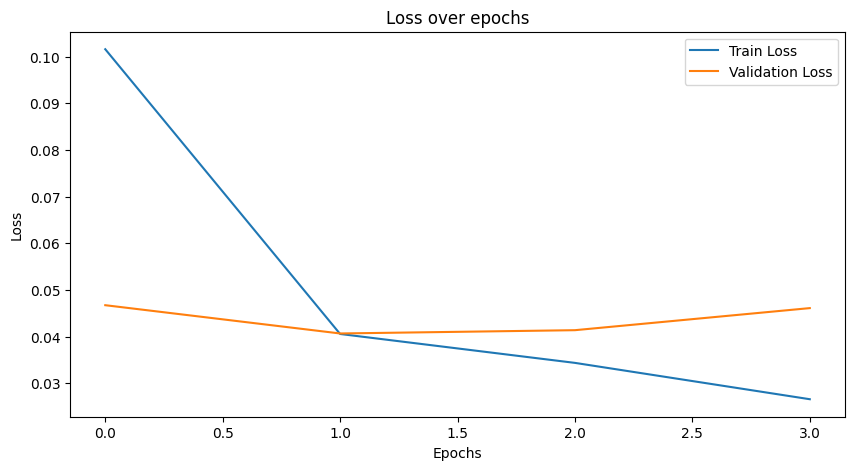

In [25]:
plt.figure(figsize=(10, 5))
plt.plot(all['train_loss_epoch'], label='Train Loss')
plt.plot(all['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

As we can see from the above plot the model run for 4 epochs and ended up in an increasing validation loss.

In [26]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

trained_model = trained_model.to(device)

In [27]:
encoding = tokenizer.encode_plus(
    "Fuck You!",
    add_special_tokens=True,
    max_length=512,
    return_token_type_ids=False,
    padding="max_length",
    return_attention_mask=True,
    return_tensors='pt',
).to(device)

_, test_prediction = trained_model(
    encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().cpu().numpy()

for label, prediction in zip(LABEL_COLUMNS, test_prediction):
    print(f"{label}: {prediction}")

toxic: 0.997747004032135
severe_toxic: 0.6354156136512756
obscene: 0.9876794219017029
threat: 0.020367084071040154
insult: 0.9246319532394409
identity_hate: 0.05746613070368767


The I have tried to evaluate the model with sample text first without thresholding. Above is the outcome of it.

In [28]:
THRESHOLD = 0.5
test_comment = "You are such a loser! You'll regret everything you've done to me!"
encoding = tokenizer.encode_plus(
    test_comment,
    add_special_tokens=True,
    max_length=512,
    return_token_type_ids=False,
    padding="max_length",
    return_attention_mask=True,
    return_tensors='pt',
).to(device)
_, test_prediction = trained_model(
    encoding["input_ids"], encoding["attention_mask"])
test_prediction = test_prediction.flatten().cpu().numpy()
for label, prediction in zip(LABEL_COLUMNS, test_prediction):
    if prediction < THRESHOLD:
        continue
    print(f"{label}: {prediction}")

toxic: 0.9833067059516907
insult: 0.8191051483154297


next up with some thresholding we can see the classification narrows down.

In [29]:
val_dataset = ToxicCommentsDataset(
    test,
    tokenizer,
    max_token_len=128,
    label_cols=['toxic', 'severe_toxic', 'obscene',
                'threat', 'insult', 'identity_hate']
)

predictions = []
labels = []
for item in tqdm(val_dataset):
    _, prediction = trained_model(
        item["input_ids"].unsqueeze(dim=0).to(device),
        item["attention_mask"].unsqueeze(dim=0).to(device)
    )
    predictions.append(prediction.flatten())
    labels.append(item["labels"].int())
predictions = torch.stack(predictions).detach().cpu()
labels = torch.stack(labels).detach().cpu()

  0%|          | 0/31915 [00:00<?, ?it/s]

Now generally looking at the performance of the model by using the test set.

In [30]:
threshold = 0.5
predictions = torch.where(predictions > threshold, 1, 0)
accuracy = torchmetrics.Accuracy(task='multilabel', num_labels=6)
accuracy_score = accuracy(predictions, labels)
accuracy_score

tensor(0.9842)

In [31]:
print("AUROC per tag")
for i, name in enumerate(LABEL_COLUMNS):
  auroc = torchmetrics.AUROC(task='multilabel', num_labels=6)
  tag_auroc = auroc(predictions.float(), labels)
  print(f"AUROC of {name}: {tag_auroc}")

AUROC per tag
AUROC of toxic: 0.8298856616020203
AUROC of severe_toxic: 0.8298856616020203
AUROC of obscene: 0.8298856616020203
AUROC of threat: 0.8298856616020203
AUROC of insult: 0.8298856616020203
AUROC of identity_hate: 0.8298856616020203


We can see the ROC-AUC score being 0.83 which is a good starting point.

In [32]:
y_pred = predictions.numpy()
y_true = labels.numpy()
upper, lower = 1, 0
y_pred = np.where(y_pred > 0.5, upper, lower)
print(classification_report(
  y_true,
  y_pred,
  target_names=LABEL_COLUMNS,
  zero_division=0
))

               precision    recall  f1-score   support

        toxic       0.81      0.85      0.83      3056
 severe_toxic       0.48      0.39      0.43       321
      obscene       0.85      0.83      0.84      1715
       threat       0.49      0.61      0.54        74
       insult       0.73      0.82      0.77      1614
identity_hate       0.67      0.51      0.58       294

    micro avg       0.78      0.80      0.79      7074
    macro avg       0.67      0.67      0.67      7074
 weighted avg       0.78      0.80      0.79      7074
  samples avg       0.07      0.08      0.07      7074



Looking at classification report the macro average for the `Recall` and `F1-Score` is `0.67`.

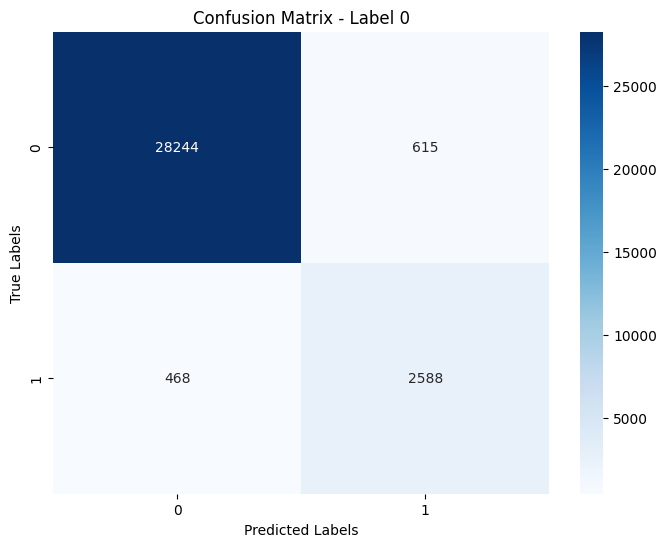

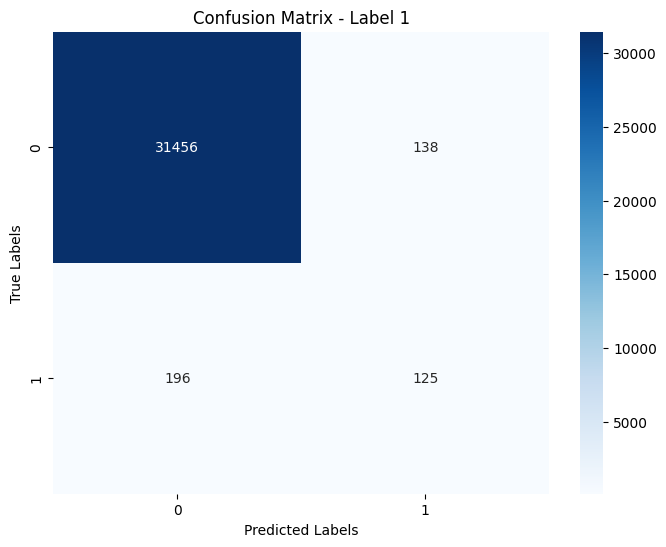

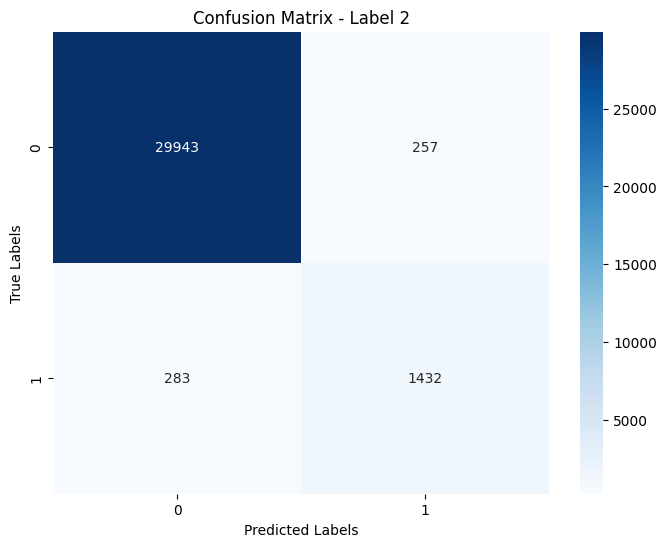

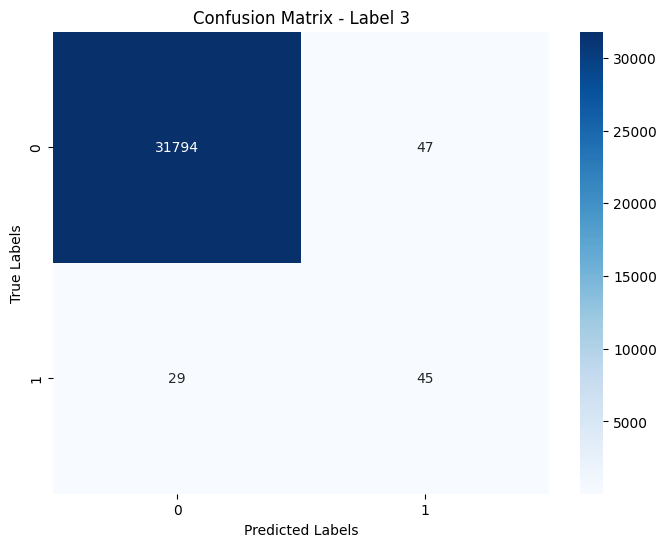

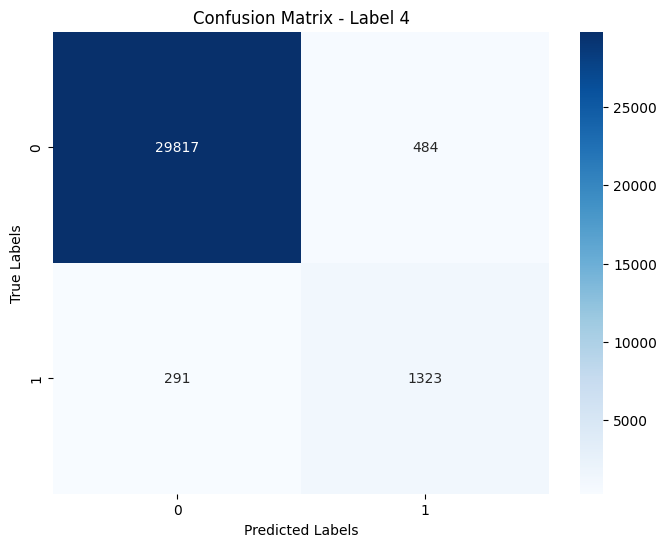

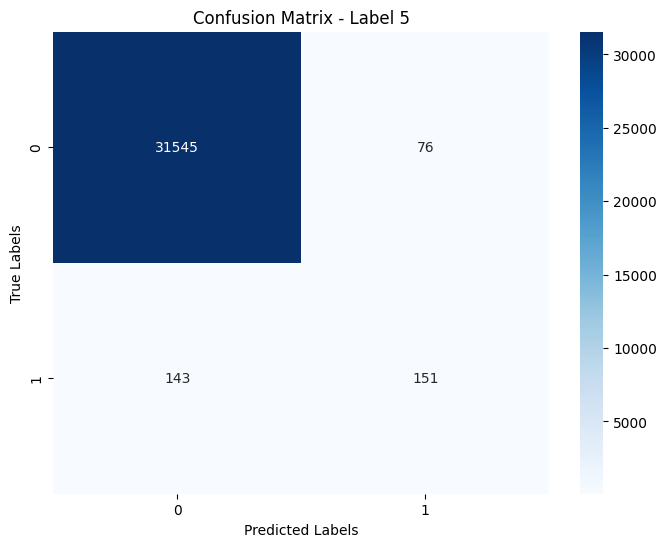

In [33]:
cm = multilabel_confusion_matrix(labels, predictions)

for i, label_cm in enumerate(cm):
    plt.figure(figsize=(8, 6))
    sns.heatmap(label_cm, annot=True, fmt="d", cmap="Blues")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title(f"Confusion Matrix - Label {i}")
    plt.show()

Also above we can see how well the model did for each class.

## Modelling with class weights


In [34]:
class_counts = train[LABEL_COLUMNS].sum().values
class_weights = 1. / class_counts 

class_weights = torch.tensor(class_weights, dtype=torch.float)

model = ToxicCommentTagger(
  n_classes=6,
  class_weights=class_weights,
  n_warmup_steps=warmup_steps,
  n_training_steps=total_training_steps
)

Now since there is imbalance in the data let us introduce class weights to the loss function we were using.

In [35]:
steps_per_epoch2=len(train) // BATCH_SIZE
total_training_steps2 = steps_per_epoch * N_EPOCHS

In [36]:
warmup_steps2 = total_training_steps2 // 5
warmup_steps2, total_training_steps2

(21276, 106380)

In [37]:
logger = TensorBoardLogger("lightning_logs", name="toxic-comments")

In [38]:
checkpoint_callback2 = ModelCheckpoint(
  dirpath="checkpoints-with-weights",
  filename="best-checkpoint",
  save_top_k=1,
  verbose=True,
  monitor="val_loss",
  mode="min"
)

In [39]:
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)

In [40]:
trainer = pl.Trainer(
  logger=logger,
  callbacks=[early_stopping_callback, checkpoint_callback],
  max_epochs=N_EPOCHS,
  accelerator='gpu',
  enable_progress_bar=True
)

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [41]:
trainer.fit(model, data_module)

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:630: Checkpoint directory /kaggle/working/checkpoints exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/opt/conda/lib/python3.10/site-packages/transformers/optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
INFO: 
  | Name       | Type            | Params
-----------------------------------------------
0 | bert       | DistilBertModel | 66.4 M
1 | classifier | Linear          | 4.6 K 
2 | criterion  | BCELoss         | 0     
3 | auroc      | MultilabelAUROC | 0     
-----------------------------------------------
66.4 M    Trainable params
0         Non-trainable params
66.4 M    Total params
265.470   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Training: |          | 0/? [00:00<?, ?it/s]

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 8511: 'val_loss' reached 0.00002 (best 0.00002), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 17022: 'val_loss' reached 0.00002 (best 0.00002), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 25533: 'val_loss' reached 0.00001 (best 0.00001), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 34044: 'val_loss' was not in top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 42555: 'val_loss' reached 0.00001 (best 0.00001), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 5, global step 51066: 'val_loss' reached 0.00001 (best 0.00001), saving model to '/kaggle/working/checkpoints/best-checkpoint.ckpt' as top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 6, global step 59577: 'val_loss' was not in top 1


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
	- Explicitly set the enviro

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 7, global step 68088: 'val_loss' was not in top 1


In [42]:
data_module.setup('test')
trainer.test(model, datamodule=data_module)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Testing: |          | 0/? [00:00<?, ?it/s]

[{}]

In [44]:
trained_model = ToxicCommentTagger.load_from_checkpoint(
  trainer.checkpoint_callback.best_model_path,
  n_classes=len(LABEL_COLUMNS),
  strict=False
)
trained_model.eval()
trained_model.freeze()

torch.save(trained_model.state_dict(), 'best_model-v2.pth')

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/core/saving.py:177: Found keys that are not in the model state dict but in the checkpoint: ['criterion.weight']


In [45]:
log_dir = './lightning_logs/toxic-comments/version_1'
all = get_all_logs(log_dir)

Now after the training is over.

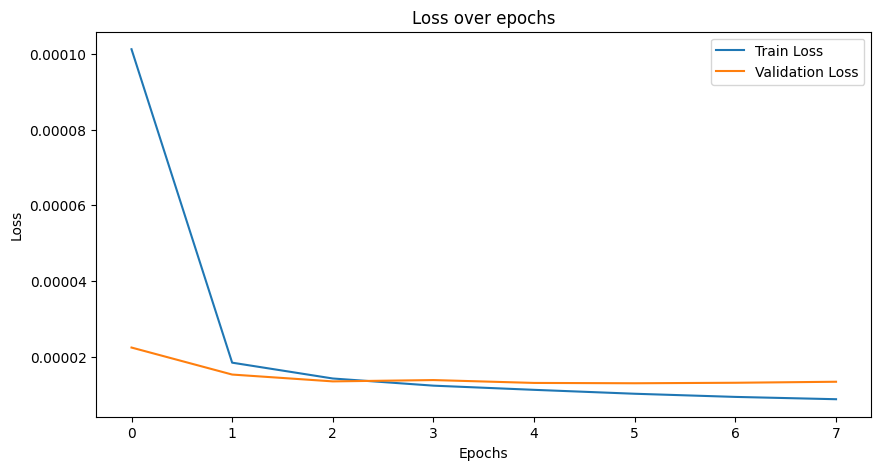

In [46]:
plt.figure(figsize=(10, 5))
plt.plot(all['train_loss_epoch'], label='Train Loss')
plt.plot(all['val_loss'], label='Validation Loss')
plt.title('Loss over epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

WE can see some improvements on the way the validaition loss is bahaving throughout epochs, and it has also run for multiple epochs as well with the validation loss decreasing steadily throughout.

In [47]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

trained_model = trained_model.to(device)

In [ ]:
val_dataset = ToxicCommentsDataset(
    test,
    tokenizer,
    max_token_len=128,
    label_cols=['toxic', 'severe_toxic', 'obscene',
                'threat', 'insult', 'identity_hate']
)

predictions = []
labels = []
for item in tqdm(val_dataset):
    _, prediction = trained_model(
        item["input_ids"].unsqueeze(dim=0).to(device),
        item["attention_mask"].unsqueeze(dim=0).to(device)
    )
    predictions.append(prediction.flatten())
    labels.append(item["labels"].int())
predictions = torch.stack(predictions).detach().cpu()
labels = torch.stack(labels).detach().cpu()

In [49]:
threshold = 0.5
predictions = torch.where(predictions > threshold, 1, 0)
accuracy = torchmetrics.Accuracy(task='multilabel', num_labels=6)
accuracy_score = accuracy(predictions, labels)
accuracy_score

tensor(0.9833)

In [51]:
print("AUROC per tag")
for i, name in enumerate(LABEL_COLUMNS):
  auroc = torchmetrics.AUROC(task='multilabel', num_labels=6)
  tag_auroc = auroc(predictions.float(), labels)
  print(f"AUROC of {name}: {tag_auroc}")

AUROC per tag
AUROC of toxic: 0.8265151381492615
AUROC of severe_toxic: 0.8265151381492615
AUROC of obscene: 0.8265151381492615
AUROC of threat: 0.8265151381492615
AUROC of insult: 0.8265151381492615
AUROC of identity_hate: 0.8265151381492615


With regards to the ROC-AUC score we don't see significant improvements.

In [52]:
y_pred = predictions.numpy()
y_true = labels.numpy()
upper, lower = 1, 0
y_pred = np.where(y_pred > 0.5, upper, lower)
print(classification_report(
  y_true,
  y_pred,
  target_names=LABEL_COLUMNS,
  zero_division=0
))

               precision    recall  f1-score   support

        toxic       0.82      0.82      0.82      3056
 severe_toxic       0.48      0.47      0.47       321
      obscene       0.80      0.85      0.82      1715
       threat       0.41      0.57      0.48        74
       insult       0.73      0.79      0.76      1614
identity_hate       0.66      0.48      0.55       294

    micro avg       0.77      0.79      0.78      7074
    macro avg       0.65      0.66      0.65      7074
 weighted avg       0.77      0.79      0.78      7074
  samples avg       0.07      0.07      0.07      7074



In terms of the recall and f1 scores we can see that we have got reduced performances here.

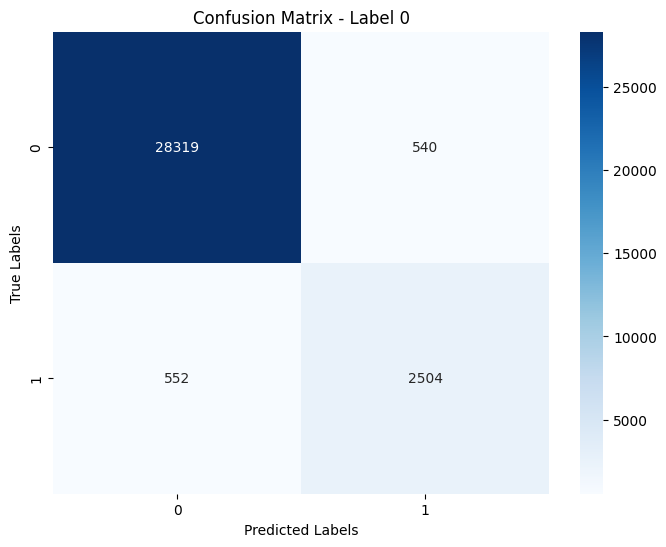

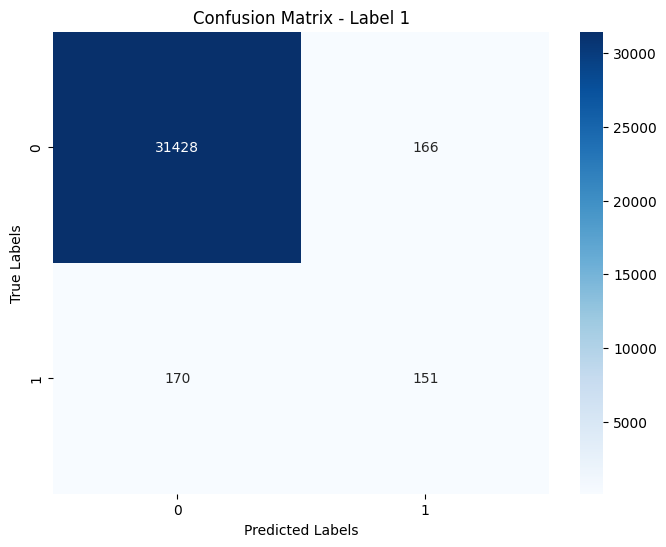

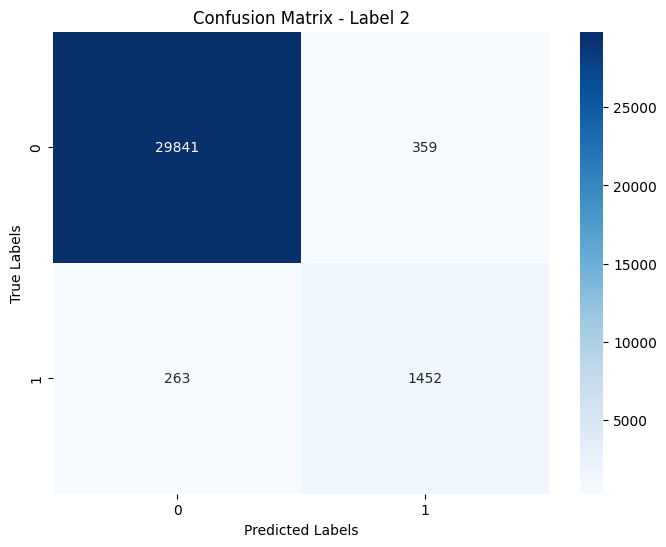

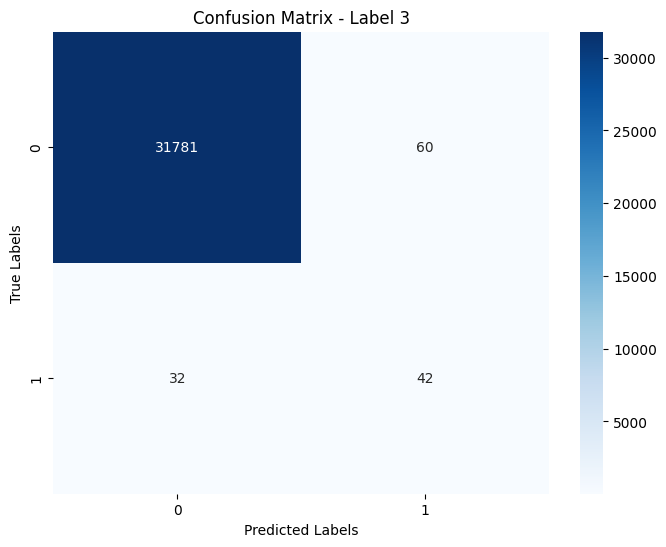

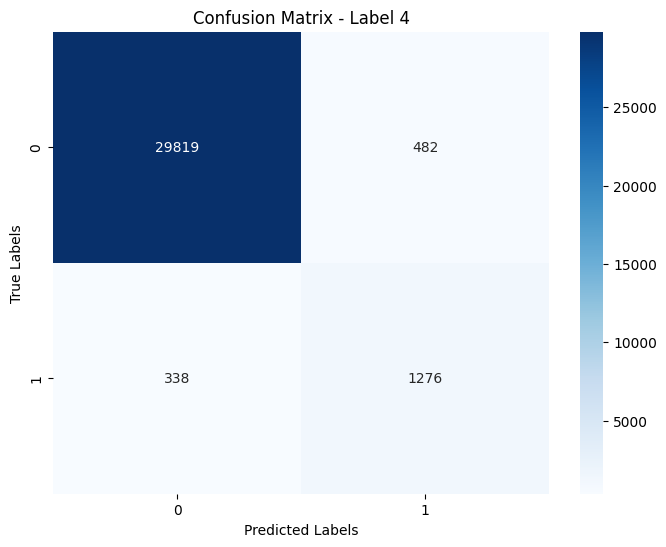

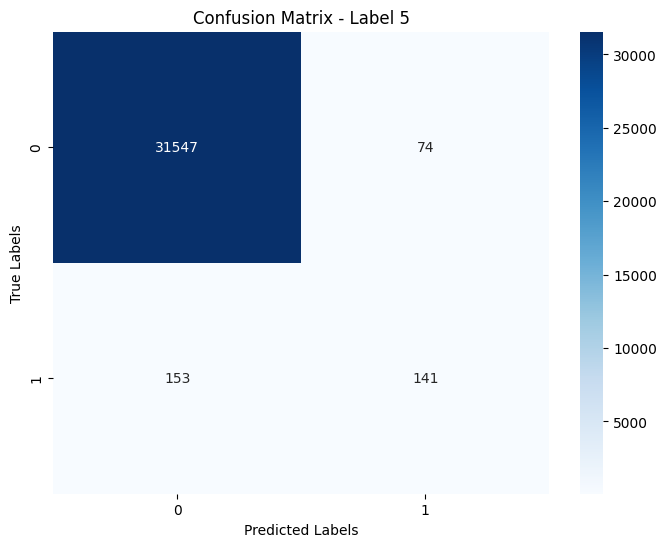

In [53]:
from sklearn.metrics import multilabel_confusion_matrix

cm = multilabel_confusion_matrix(labels, predictions)

for i, label_cm in enumerate(cm):
    plt.figure(figsize=(8, 6))
    sns.heatmap(label_cm, annot=True, fmt="d", cmap="Blues")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title(f"Confusion Matrix - Label {i}")
    plt.show()

## Conclusion and Future improvements

In summary in this notebook I have tried to create a Multi Lable classifier for toxic comments. I have utilized the DistilBERT model for the training with BCE loss. The model has delivered good performance for classifying toxic comments but still can be improved.

Due to longer runtimes I have run the training on limit max token sizes which might have affected the models performance and the other thing is I have used a much smaller model as compared to a better one which is `RoBERTa` one can also add that to this notebook for even better performances. 